# Evaluation of clustering

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sb
import os

# Import
- features
- diagnoses
- featurs of consultation with at least one of the top 10 diagnoses
- features after dimensionality reduction
- results of all clustering approaches

In [3]:
# import features
features = pd.read_pickle("data/rwanda/features.pickle")

# import diagnoses
diagnoses = pd.read_pickle("data/rwanda/diagnoses.pickle")

# import features in 2D after dimensionality reduction
features_after_dimensionality_reduction = pd.read_pickle("data/rwanda/features_after_dimensionality_reduction.pickle")

# import features of consultations with at least one top 10 diagnosis
features_consultations_with_at_least_one_top_10_diagnosis = pd.read_pickle("data/rwanda/features_consultations_with_at_least_one_top_10_diagnosis")

# import diagnoses of consultations with at least one top 10 diagnosis
diagnoses_consultations_with_at_least_one_top_10_diagnosis = pd.read_pickle("data/rwanda/diagnoses_consultations_with_at_least_one_top_10_diagnosis")

# import clustering results
clustering_result_files = os.listdir("data/rwanda/clustering_results")

clustering_results = []
for file in clustering_result_files:
    clustering_results.append({"method":file.replace(".pickle", "").replace("k_", "K-").replace("_", " "),"result":pd.read_pickle("data/rwanda/clustering_results/"+file)})

# Basic comparison clustering results

In [4]:
for clustering in clustering_results:
    # number of consultations per cluster
    fig = px.bar(
        clustering["result"].groupby("cluster").size().reset_index(name="number_consultations"),
        x="cluster",
        y="number_consultations",
        labels={
            "cluster":"Cluster",
            "number_consultations":"Number consultations",
        },
        title=f"Number of consultations per cluster <br><sup>for clustering approach: '{clustering['method']}'</sup>"
    )
    fig.show()

In [5]:
# which consultations switched their clusters when the clusterng approach changed
movement_consultations_between_clusters_depending_on_clustering = pd.DataFrame()

for clustering in clustering_results:
    movement_consultations_between_clusters_depending_on_clustering["cluster "+clustering["method"]] = clustering["result"]["cluster"]
movement_consultations_between_clusters_depending_on_clustering

,cluster K-means preprocessed with domain knowledge,cluster K-means preprocessed with domain knowledge and manual centroid init,cluster K-means with K-prototypes preprocessed features,cluster K-means with K-prototypes preprocessed features and manual centroid init,cluster K-prototypes preprocessed features
0,1,5,0.0,0.0,2.0
1,1,8,0.0,0.0,2.0
2,2,2,NaN,NaN,NaN
3,1,4,9.0,9.0,2.0
4,1,0,5.0,0.0,2.0
...,...,...,...,...,...
23150,1,3,NaN,NaN,NaN
23151,0,7,NaN,NaN,NaN
23152,2,9,NaN,NaN,NaN
23153,1,5,3.0,4.0,6.0


In [6]:
import plotly.graph_objects as go

offset = 0
labels = []
source = []
target = []
value = []

for i, approach in enumerate(movement_consultations_between_clusters_depending_on_clustering.columns):
    try:
        next_approach = movement_consultations_between_clusters_depending_on_clustering.columns[i]
        temp = movement_consultations_between_clusters_depending_on_clustering.groupby([approach, next_approach]).size().reset_index(name="count").sort_values(by=[approach, next_approach])

        new_labels = temp[approach].astype(str) + "_" + approach
        more_new_labels = temp[next_approach].astype(str) + "_" + next_approach
        labels = new_labels + more_new_labels
        source = temp[approach] + offset, # indices correspond to labels, eg A1, A2, A1, B1, ...
        target = temp[next_approach] + np.max(temp[approach]) + offset,
        value = temp["count"]
        offset = np.max(temp[approach]) + offset
    except:
        break

# flatten arrays
labels = sum(labels, [])
source = sum(source, [])
target = sum(target, [])
value = sum(value, [])

#plot sankey diagram
fig_movement_consultatons = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = labels,
      color = "blue"
    ),
    link = dict(
      source = source, # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = target,
      value = value
  ))])

fig_movement_consultatons.update_layout(title_text="Sankey Diagram of consultations moving between clusters of different clustering approaches", font_size=10)
fig_movement_consultatons.show()

In [7]:
"""import plotly.graph_objects as go

temp = movement_consultations_between_clusters_depending_on_clustering.groupby(["cluster_k-means", "cluster_imputation by context"]).size().reset_index(name="count").sort_values(by=["cluster_k-means", "cluster_imputation by context"])
labels = []
source = []
target = []
for i, approach in enumerate(movement_consultations_between_clusters_depending_on_clustering.columns):


fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 15,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = ["0", "1", "2", "3", "0", "1", "2", "3"],
      color = "blue"
    ),
    link = dict(
      source = temp["cluster_k-means"], # indices correspond to labels, eg A1, A2, A1, B1, ...
      target = temp["cluster_imputation by context"]+3,
      value = temp["count"]
  ))])

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10)
fig.show()"""

'import plotly.graph_objects as go\n\ntemp = movement_consultations_between_clusters_depending_on_clustering.groupby(["cluster_k-means", "cluster_imputation by context"]).size().reset_index(name="count").sort_values(by=["cluster_k-means", "cluster_imputation by context"])\nlabels = []\nsource = []\ntarget = []\nfor i, approach in enumerate(movement_consultations_between_clusters_depending_on_clustering.columns):\n\n\nfig = go.Figure(data=[go.Sankey(\n    node = dict(\n      pad = 15,\n      thickness = 20,\n      line = dict(color = "black", width = 0.5),\n      label = ["0", "1", "2", "3", "0", "1", "2", "3"],\n      color = "blue"\n    ),\n    link = dict(\n      source = temp["cluster_k-means"], # indices correspond to labels, eg A1, A2, A1, B1, ...\n      target = temp["cluster_imputation by context"]+3,\n      value = temp["count"]\n  ))])\n\nfig.update_layout(title_text="Basic Sankey Diagram", font_size=10)\nfig.show()'

In [8]:
# comparison silhouette score
from sklearn.metrics import silhouette_score

methods = []
silhouette_score_results = []
for clustering in clustering_results:
     data = clustering["result"]
     methods.append(clustering["method"])
     try:
          score = silhouette_score(data.drop(["cluster"], axis=1), data["cluster"], metric='euclidean') 
          silhouette_score_results.append(score)
     except:
          silhouette_score_results.append(np.nan)

silhouette_score_per_clustering_method = pd.DataFrame({"Clustering approach": methods, "Silhouette score": silhouette_score_results})
silhouette_score_per_clustering_method[" "] = ""
fig_silhouette_scores = px.bar(
     silhouette_score_per_clustering_method.sort_values(by="Clustering approach"), 
     x=" ", 
     y="Silhouette score", 
     title="Silhouette score of tested clustering approaches",
     color="Clustering approach",
     barmode="group"
)
"""new_labels = {}
for approach in silhouette_score_per_clustering_method["Clustering approach"]:
     new_labels[approach] = " "
fig_silhouette_scores.update_xaxes(labelalias=new_labels)"""
fig_silhouette_scores.show()

# Visualisation after dimensionality reduction 

In [15]:
diagnoses_and_features_after_dimensionality_reduction = features_after_dimensionality_reduction.merge(diagnoses_consultations_with_at_least_one_top_10_diagnosis, how="left", left_index=True, right_index=True).fillna("Not considered for clustering")
diagnoses_and_features_after_dimensionality_reduction = pd.melt(diagnoses_and_features_after_dimensionality_reduction,  id_vars=["Dimension 1","Dimension 2"], value_vars=diagnoses_consultations_with_at_least_one_top_10_diagnosis.columns, var_name="Diagnosis", value_name="Diagnosis status")

fig_features_with_overlaid_diagnoses = px.scatter(
    diagnoses_and_features_after_dimensionality_reduction[diagnoses_and_features_after_dimensionality_reduction["Diagnosis status"] == 1.0].sort_values(by="Diagnosis"), 
    x="Dimension 1", 
    y="Dimension 2", 
    color="Diagnosis",
    title=f"Features after UMAP dimensionality reduction <br><sup>with 10 most common diagnoses overlaid</sup>"
)
fig_features_with_overlaid_diagnoses.show()

In [23]:
for clustering in clustering_results:
    data = features_after_dimensionality_reduction.merge(clustering_results[0]["result"]["cluster"], how="left", left_index=True, right_index=True).fillna("Not considered for clustering") 
    data["cluster"] = data["cluster"].astype(str)
    fig = px.scatter(
        data.sort_values(by="cluster"), 
        x="Dimension 1", 
        y="Dimension 2", 
        color="cluster", 
        title=f"Clustering result after UMAP dimensionality reduction <br><sup>for clustering approach:'{clustering['method']}'</sup>",
        labels={"cluster":"Cluster"}
    )
    fig.show()

# Descriptive statistics
- feature distribution per cluster --> which feature decides the clustering result?
- diagnoses distribution per cluster --> which cluster corresponds to which diagnosis?

## Features in clusters

In [ ]:
# TODO

## Diagnoses in clusters

### General analysis of diagnoses

In [46]:
# top 10 most common diagnoses
top10_diagnoses = diagnoses.sum().sort_values(ascending=False).to_frame().reset_index().head(10)
top10_diagnoses.columns = ["diagnosis", "number_consultations"]
print("share of top 10 diagnoses:", top10_diagnoses["number_consultations"].sum()/diagnoses.shape[0], "= share of consultations being diagnosed with at least one of the top 10 diagnoses")
fig_top10_diagnoses = px.bar(top10_diagnoses, x="diagnosis", y="number_consultations", title="Top 10 given diagnoses", labels={"number_consultations" : "Number consultations", "diagnosis": "Diagnosis"})
fig_top10_diagnoses.show()

share of top 10 diagnoses: 0.6952474584780153 = share of consultations being diagnosed with at least one of the top 10 diagnoses


In [47]:
# distribution "number of top 10 diagnoses per consultation" 
number_top10_diagnoses_per_consultation = diagnoses[top10_diagnoses["diagnosis"]].sum(axis=1).value_counts().to_frame().reset_index()
number_top10_diagnoses_per_consultation.columns = ["Number top 10 diagnoses per consultation", "Count"]
fig_distribution_number_top10_diagnoses_per_consultation = px.bar(number_top10_diagnoses_per_consultation, x="Number top 10 diagnoses per consultation", y="Count", title="Distribution of 'Number of top 10 diagnoses per consultation'")
fig_distribution_number_top10_diagnoses_per_consultation.show()

### Cluster analysis regarding diagnoses

In [79]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

for clustering in clustering_results:
    diagnoses_per_cluster = diagnoses_consultations_with_at_least_one_top_10_diagnosis

    # add cluster result to diagnoses
    diagnoses_per_cluster["cluster"] = clustering["result"]["cluster"]
    number_consultations_per_cluster = diagnoses_per_cluster.groupby("cluster").size().reset_index(name="number_consultations")
    diagnoses_per_cluster = diagnoses_per_cluster.groupby("cluster").sum().reset_index()
    diagnoses_per_cluster = diagnoses_per_cluster.merge(number_consultations_per_cluster, on="cluster")

    number_diagnoses_per_cluster = pd.melt(
        diagnoses_per_cluster,
        id_vars=["cluster"], 
        value_vars=diagnoses_per_cluster.columns.drop(["cluster", "number_consultations"]),
        var_name="diagnosis", value_name="number_consultations"
    )

    for d in top10_diagnoses["diagnosis"]:
        diagnoses_per_cluster[d] = diagnoses_per_cluster[d] / diagnoses_per_cluster["number_consultations"]

    share_diagnoses_per_cluster = pd.melt(
        diagnoses_per_cluster,
        id_vars=["cluster"], 
        value_vars=diagnoses_per_cluster.columns.drop(["cluster", "number_consultations"]),
        var_name="diagnosis", value_name="share_number_consultations"
    )

    clusters = range(int(diagnoses_per_cluster["cluster"].max())+1)

    # print diagnoses and the clusters if they are not present in every cluster
    diagnoses_cluster_appearance = number_diagnoses_per_cluster.groupby("diagnosis").size().reset_index(name="number_cluster_appearance")
    print("Diagnoses determining clusters:", diagnoses_cluster_appearance[diagnoses_cluster_appearance["number_cluster_appearance"]<len(clusters)])

    # plot diagnoses distribution
    fig_diagnoses = px.bar(
        share_diagnoses_per_cluster, 
        x="cluster", 
        y="share_number_consultations", 
        animation_frame="diagnosis",
        barmode="group", 
        title=f"Number of consultations with respective diagnosis per cluster <br><sup>for clustering approach:'{clustering['method']}'</sup>",
        labels={"share_number_consultations": "Share number of consultations", "diagnosis":"Diagnosis", "cluster":"Cluster"}  
    )
    fig_diagnoses.show()

    # plot top 10 diagnosis per cluster and other diagnoses are summarized as "Other"
    # create subplots: use 'domain' type for Pie subplot for each cluster
    fig = make_subplots(rows=1, cols=len(clusters), specs=[[{'type':'domain'} for c in clusters]])
    for cluster in clusters:
        diagnoses_composition = number_diagnoses_per_cluster.loc[number_diagnoses_per_cluster["cluster"] == cluster, ["diagnosis", "number_consultations"]].sort_values(by="number_consultations", ascending=False).reset_index(drop=True)
        
        # get only top 10 and compute "other" diagnoses
        sum_other_diagnoses = diagnoses_composition.loc[11:,"number_consultations"].sum()
        diagnoses_composition = diagnoses_composition[:10]
        diagnoses_composition.loc[diagnoses_composition.shape[0]] = {"diagnosis":"other", "number_consultations":sum_other_diagnoses}
        fig.add_trace(
            go.Pie(labels=diagnoses_composition["diagnosis"], values=diagnoses_composition["number_consultations"], name="Cluster "+str(cluster)), 
            1, [int(cluster+1)]
        )

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hoverinfo="label+percent+name")

    fig.update_layout(
        title_text=f"Top 10 diagnoses per cluster <br><sup>for clustering approach:'{clustering['method']}'</sup>",
    )
    fig.show()

Diagnoses determining clusters:                                  diagnosis  number_cluster_appearance
0                           acute diarrhea                          9
1              bacterial acute pharyngitis                          9
2                      bacterial pneumonia                          9
3                              common cold                          9
4  intestinal parasitic infection protozoa                          9
5                     mild moderate anemia                          9
6                    moderate malnutrition                          9
7           non severe abdominal condition                          9
8                      non severe headache                          9
9                          viral pneumonia                          9


This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.


This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.


Diagnoses determining clusters: Empty DataFrame
Columns: [diagnosis, number_cluster_appearance]
Index: []


Diagnoses determining clusters: Empty DataFrame
Columns: [diagnosis, number_cluster_appearance]
Index: []


This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.


This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.


Diagnoses determining clusters: Empty DataFrame
Columns: [diagnosis, number_cluster_appearance]
Index: []


This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.


Diagnoses determining clusters: Empty DataFrame
Columns: [diagnosis, number_cluster_appearance]
Index: []


# Supervised learning

In [37]:
# build lgbm classifier with diagnoses as features to see how well they explain the labels
import lightgbm as lgb # was chosen as mutlinominal regression did not converge and because it is later used due to its advantage of being able to take in categorical values
from sklearn.model_selection import cross_val_score
import shap
import re

# function for evaluate cluster result based on accuracy and shap values of lgbm classifier
def evaluate_with_lgbm_classifier(data, labels, title):
    # rename columns so that lgbm can read them
    data.columns = [re.sub(r'(>)|(<)', lambda m: 'higher' if m.group(1) else 'lower', c) for c in data.columns] # essental to ensure that columns are stll dstnct after next lne of code
    data.columns = [re.sub('[^A-Za-z0-9_]+', ' ', c) for c in data.columns]

    # check how good the clusters are: the higher F1 the better
    clf = lgb.LGBMClassifier() #colsample_by_tree=0.8
    cv_scores = cross_val_score(clf, data, labels, scoring='f1_weighted')
    mean_cv_scores = np.mean(cv_scores)
    print(f"CV F1 score of classifier is {mean_cv_scores}")

    # check how features are used to explain the label
    clf.fit(data, labels) # fit model

    #SHAP values to determine how features are used for classification
    explainer = shap.TreeExplainer(clf)
    shap_values = explainer.shap_values(data)
    shap.summary_plot(shap_values, data, plot_type="bar", plot_size=(15, 10), show=False)
    plt.title(title)
    plt.show()

    return mean_cv_scores

# use preprocssed features of clustering approach: K-means with K-prototypes preprocessed features as baseline data
baseline_features = [clustering["result"].drop(["cluster"], axis=1) for clustering in clustering_results if clustering["method"] == "K-means with K-prototypes preprocessed features"][0]

## Feature based classifier for cluster labels
- Accuracy throucg cv f1 score --> how well did the cluster approach cluster?
- feature importance through SHAP value analysis --> how many and which features determine which cluster?

The least populated class in y has only 1 members, which is less than n_splits=5.


CV F1 score of classifier is 0.7962166594653721


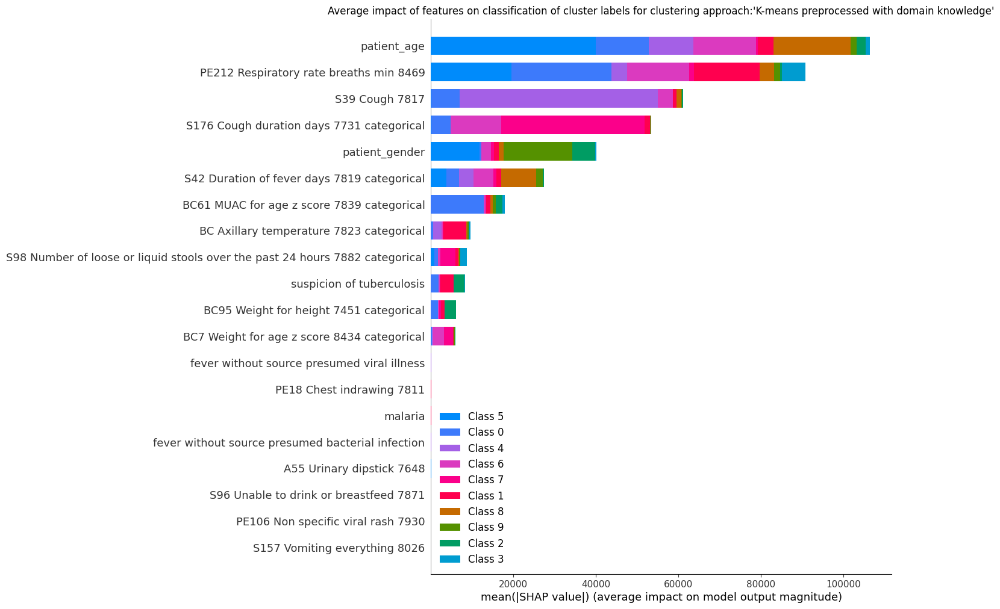

CV F1 score of classifier is 0.9967981732966195


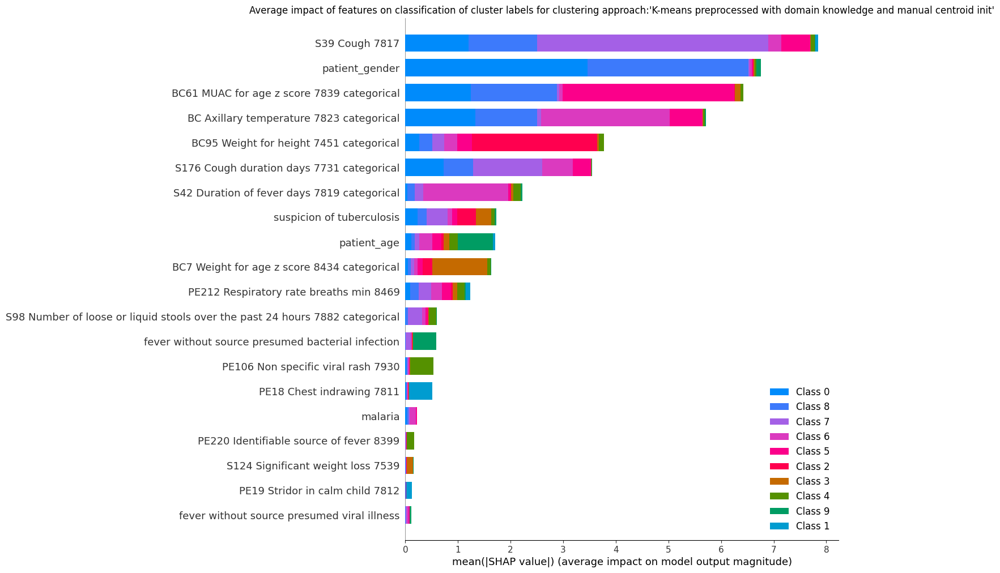

The least populated class in y has only 2 members, which is less than n_splits=5.


CV F1 score of classifier is 0.4629758619539316


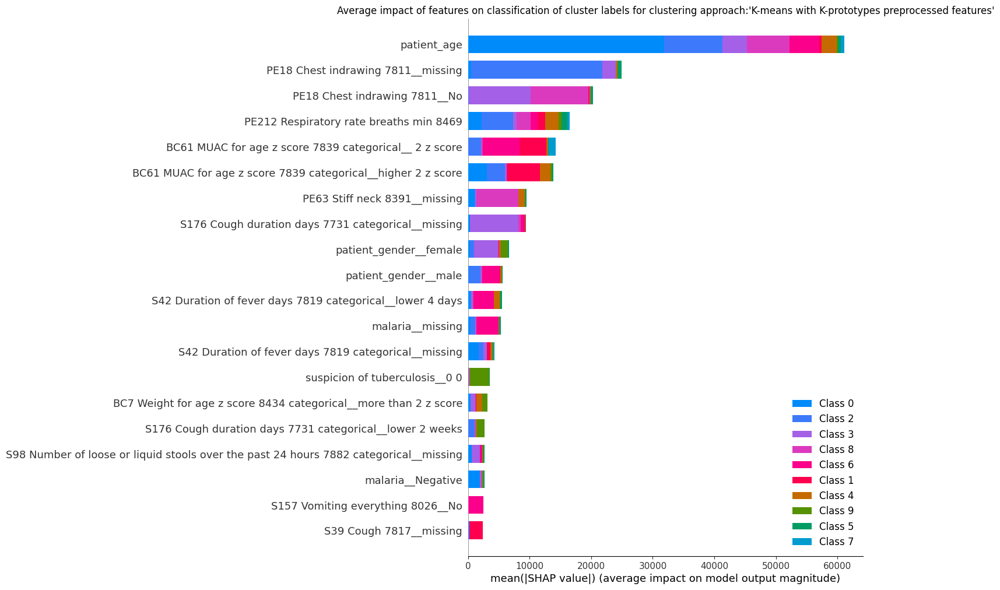

CV F1 score of classifier is 0.9970556690751154


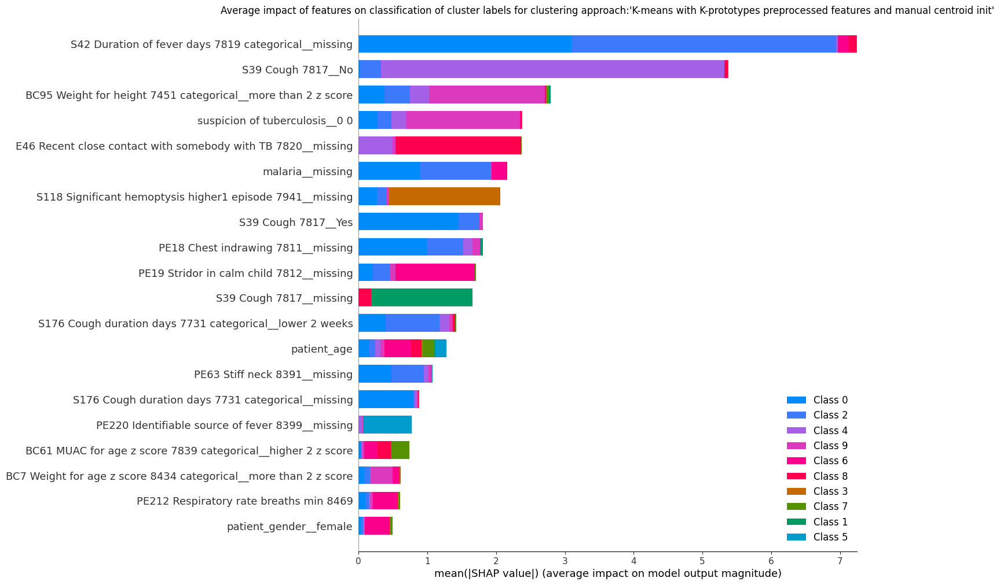

CV F1 score of classifier is 0.9955956041009643


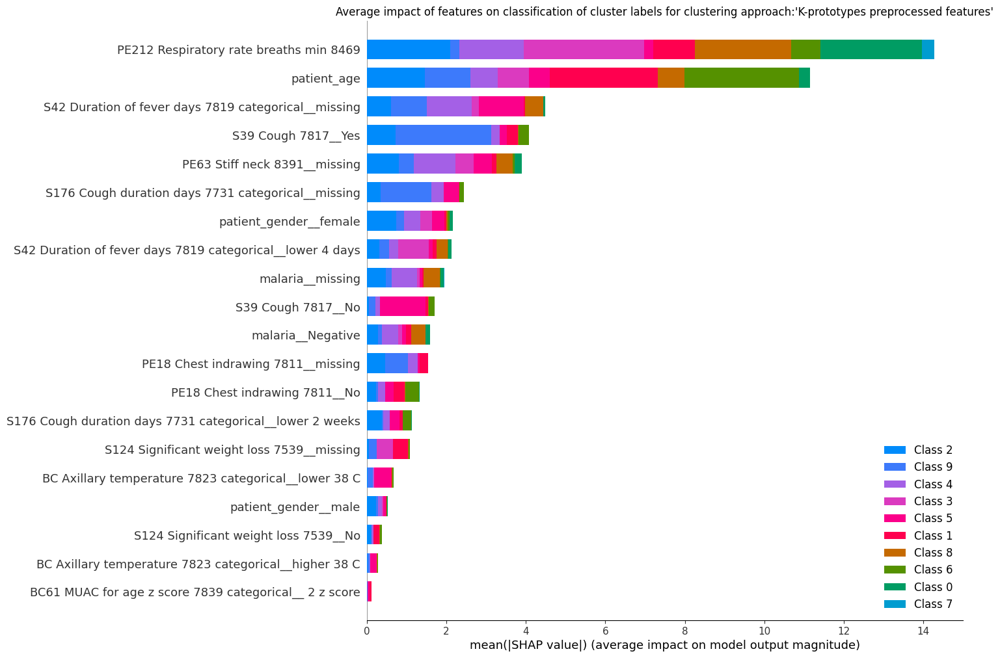

In [38]:
methods = []
accuracy_scores = []
for clustering in clustering_results:
     data = clustering["result"].drop(["cluster"], axis=1)
     labels = clustering["result"]["cluster"]
     methods.append(clustering["method"])
     try: 
          score = evaluate_with_lgbm_classifier(data, labels, f"Average impact of features on classification of cluster labels for clustering approach:'{clustering['method']}'")
     except:
          score = evaluate_with_lgbm_classifier(baseline_features, labels, f"Average impact of features on classification of cluster labels for clustering approach:'{clustering['method']}'")
     accuracy_scores.append(score)
    
     
accuracy_score_per_clustering_method = pd.DataFrame({"Clustering approach": methods, "Cross-validated F1 score": accuracy_scores})
accuracy_score_per_clustering_method[" "] = ""
fig_accuracy_scores = px.bar(
     accuracy_score_per_clustering_method.sort_values(by="Clustering approach"), 
     x=" ", 
     y="Cross-validated F1 score", 
     title="Accuracy of tested clustering approaches",
     color="Clustering approach",
     barmode="group"
)

fig_accuracy_scores.show()

## Diagnosis based classifier for cluster labels
- Accuracy through cv f1 score --> how well do diagnoses explain clustering?
- feature importance through SHAP value analysis --> how many and which diagnoses determine which cluster?

The least populated class in y has only 1 members, which is less than n_splits=5.


CV F1 score of classifier is 0.7141071172681124


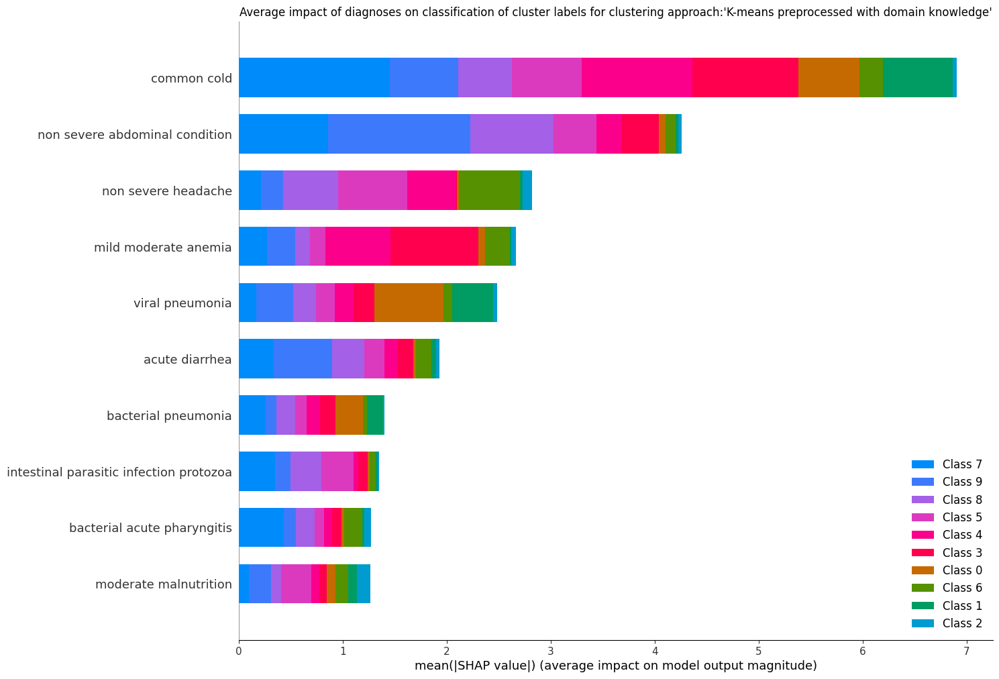

CV F1 score of classifier is 0.33368180783148227


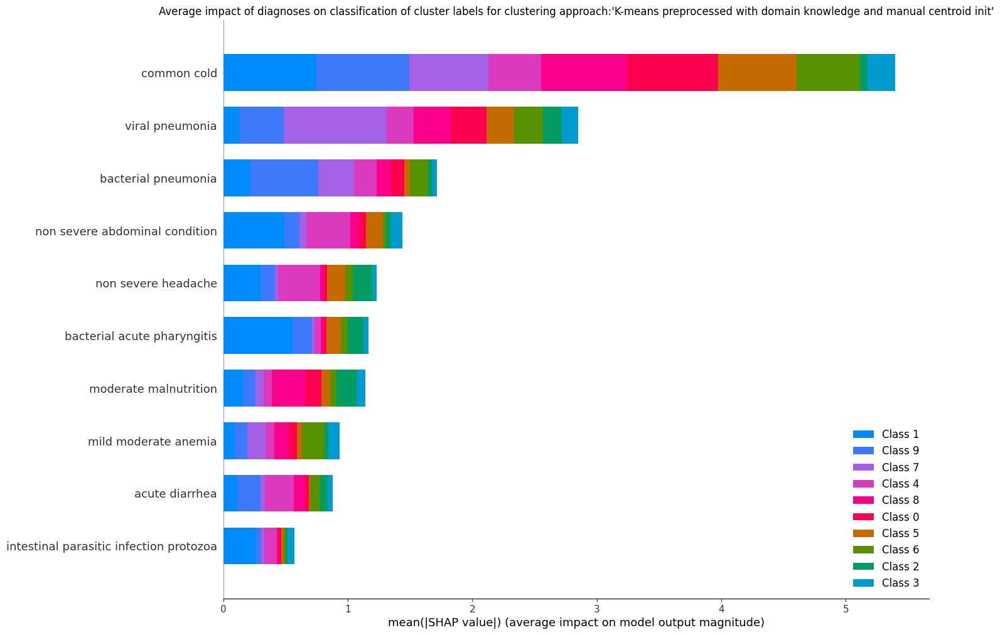

The least populated class in y has only 2 members, which is less than n_splits=5.


CV F1 score of classifier is 0.44918630289107797


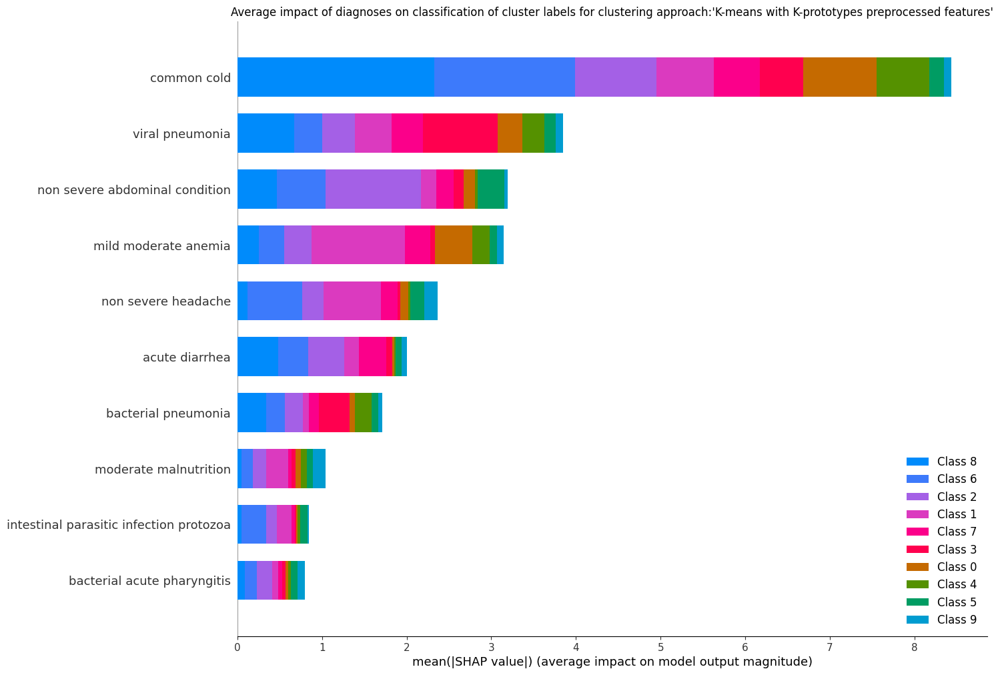

CV F1 score of classifier is 0.40902889485231925


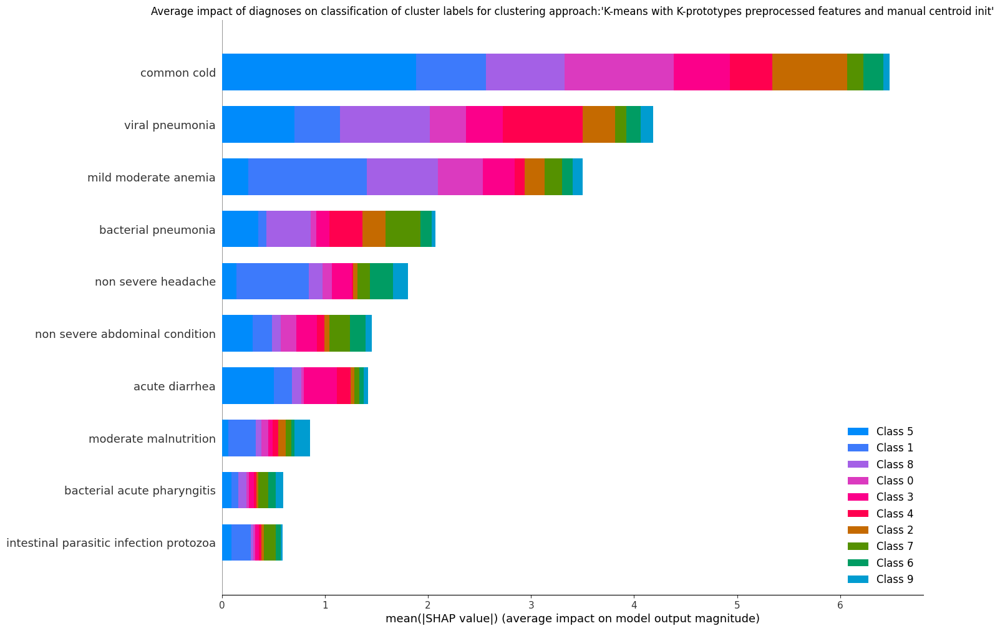

CV F1 score of classifier is 0.3342984842376565


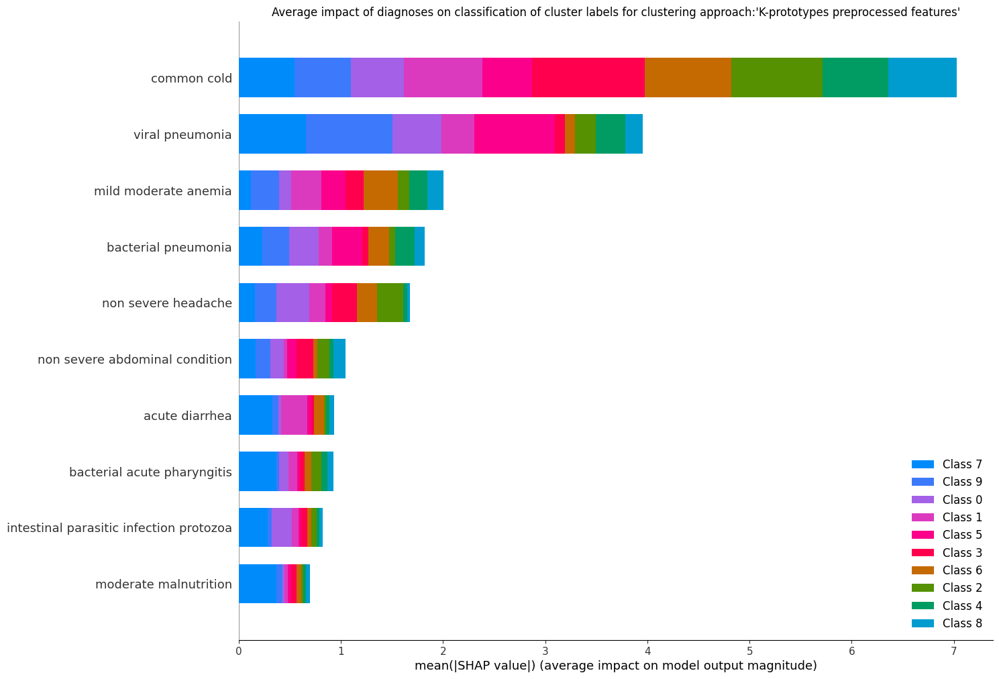

In [42]:
methods = []
accuracy_scores = []
for clustering in clustering_results:
     data = diagnoses_consultations_with_at_least_one_top_10_diagnosis
     labels = clustering["result"]["cluster"]
     methods.append(clustering["method"])
     score = evaluate_with_lgbm_classifier(data, labels, f"Average impact of diagnoses on classification of cluster labels for clustering approach:'{clustering['method']}'")
     accuracy_scores.append(score)

diagnoses_accuracy_score_per_clustering_method = pd.DataFrame({"Clustering approach": methods, "Cross-validated F1 score": accuracy_scores})
diagnoses_accuracy_score_per_clustering_method[" "] = ""
fig_diagnoses_accuracy_scores = px.bar(
     diagnoses_accuracy_score_per_clustering_method.sort_values(by="Clustering approach"), 
     x=" ", 
     y="Cross-validated F1 score", 
     title="Accuracy of 10 most common diagnoses explaining results of clustering approaches",
     color="Clustering approach",
     barmode="group"
)

fig_diagnoses_accuracy_scores.show()

## Missingness based classifier for cluster labels
- Accuracy throuch cv f1 score --> how well does missingness of features explain clustering?
- feature importance through SHAP value analysis --> how many and which features' missingness determine which cluster?

The least populated class in y has only 1 members, which is less than n_splits=5.


CV F1 score of classifier is 0.4305383347965387


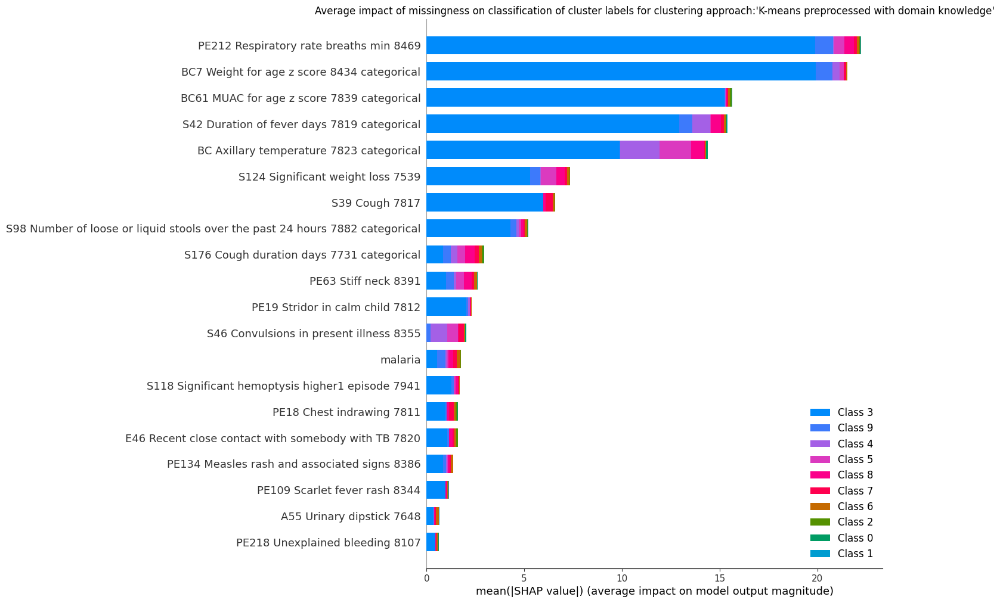

CV F1 score of classifier is 0.1266025362198171


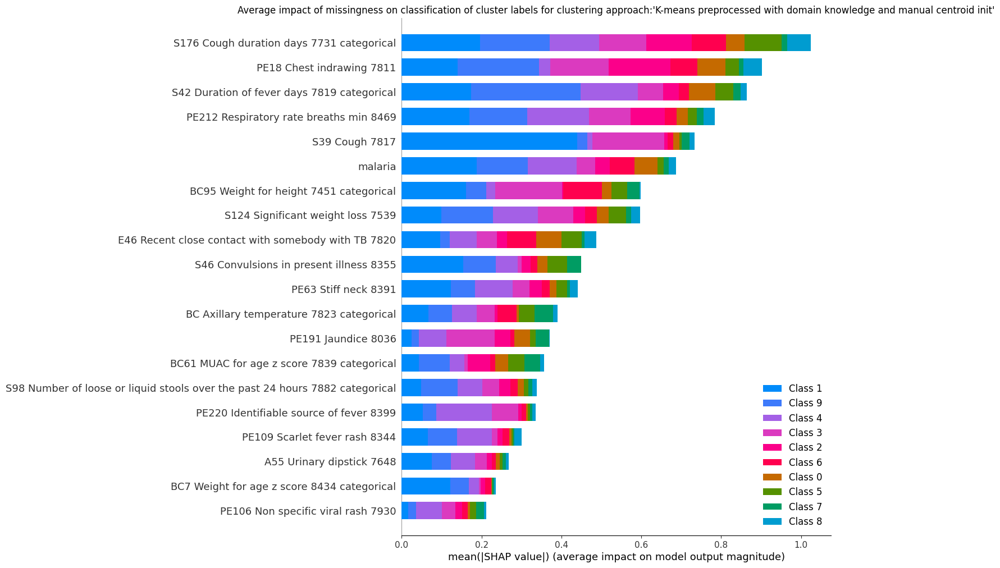

The least populated class in y has only 2 members, which is less than n_splits=5.


CV F1 score of classifier is 0.7764683528769905


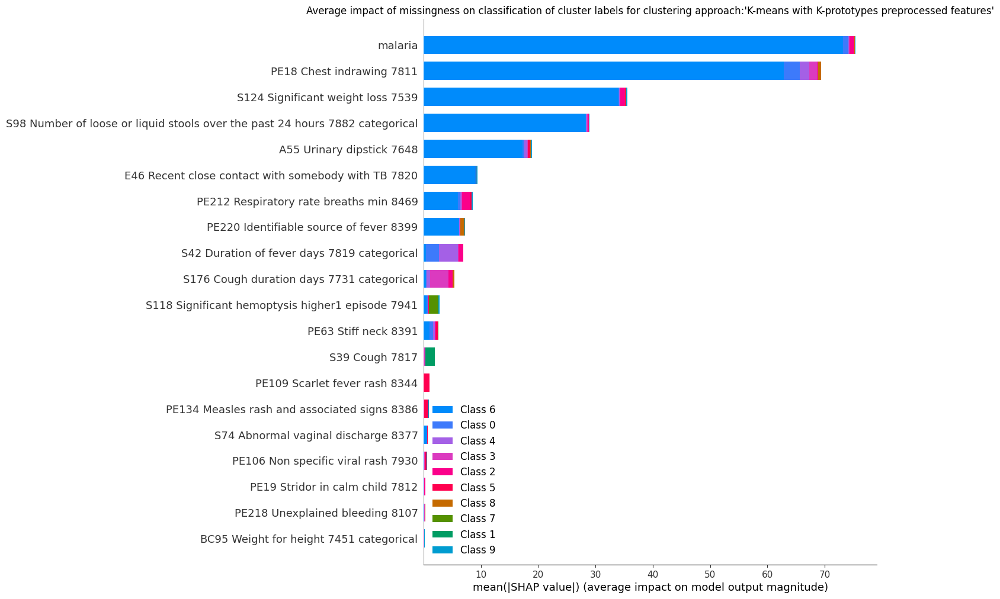

CV F1 score of classifier is 0.8517856972029753


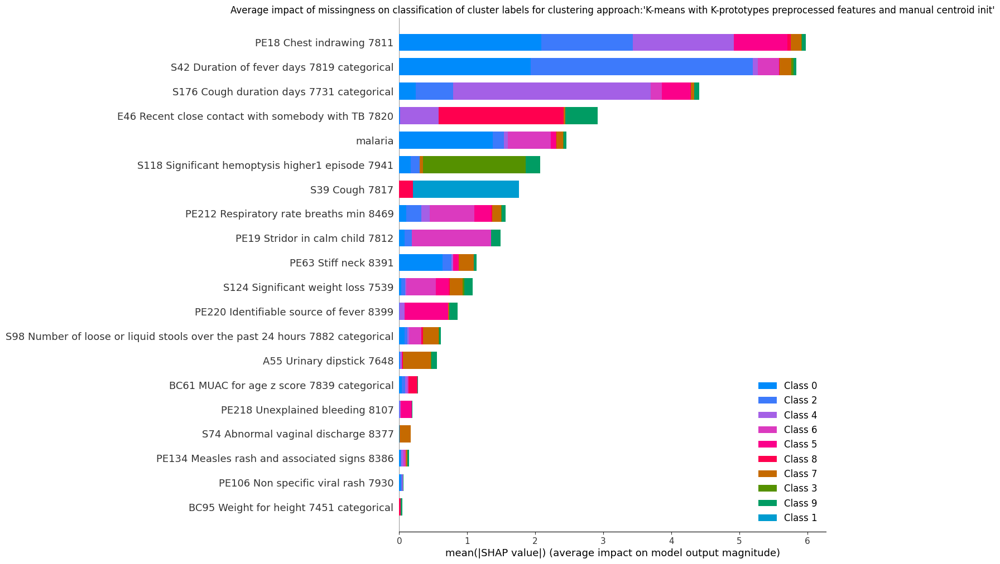

CV F1 score of classifier is 0.6057709614299692


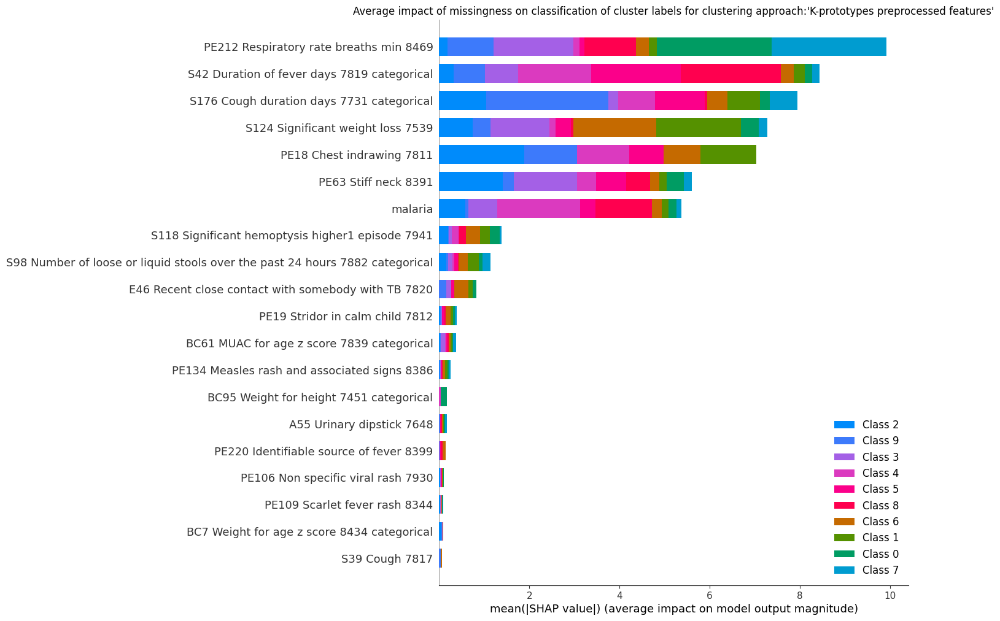

In [45]:
methods = []
accuracy_scores = []
for clustering in clustering_results:
    data = pd.merge(features.isna()*1, clustering["result"]["cluster"], how="right", left_index=True, right_index=True)
    methods.append(clustering["method"])
    score = evaluate_with_lgbm_classifier(data.drop(["cluster"], axis=1), data["cluster"], f"Average impact of missingness on classification of cluster labels for clustering approach:'{clustering['method']}'")
    accuracy_scores.append(score)

missingness_accuracy_score_per_clustering_method = pd.DataFrame({"Clustering approach": methods, "Cross-validated F1 score": accuracy_scores})
missingness_accuracy_score_per_clustering_method[" "] = ""
fig_missingness_accuracy_scores = px.bar(
    missingness_accuracy_score_per_clustering_method.sort_values(by="Clustering approach"), 
    x=" ", 
    y="Cross-validated F1 score", 
    title="Accuracy of missingness explaining results of clustering approaches",
    color="Clustering approach",
    barmode="group"
)

fig_missingness_accuracy_scores.show()